# Debnath


## 0. Setting up workenvironment<a id="0"></a>

In [1]:
suppressPackageStartupMessages({
    library(DropletUtils)
    library(SingleCellExperiment)
    library(scuttle)
    library(Seurat)
    library(SeuratWrappers)
    library(stringr)
    library(dplyr)
    library(data.table)
    library(Matrix)
    library(patchwork)
    library(ggplot2)
})

options(repr.plot.width = 16, repr.plot.height = 8)

## Loading data

### 3.1. Data analysis Seurat<a id="9"></a>

In [83]:
A <- readRDS(file = "Debnath.Rds")

In [48]:
A <- NormalizeData(A, verbose = FALSE)
A <- FindVariableFeatures(A, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(A), 10)

In [49]:
all.genes <- rownames(A)
A <- ScaleData(A, features = all.genes)

Centering and scaling data matrix



In [50]:
A <- RunPCA(A, features = VariableFeatures(object = A), verbose = FALSE)

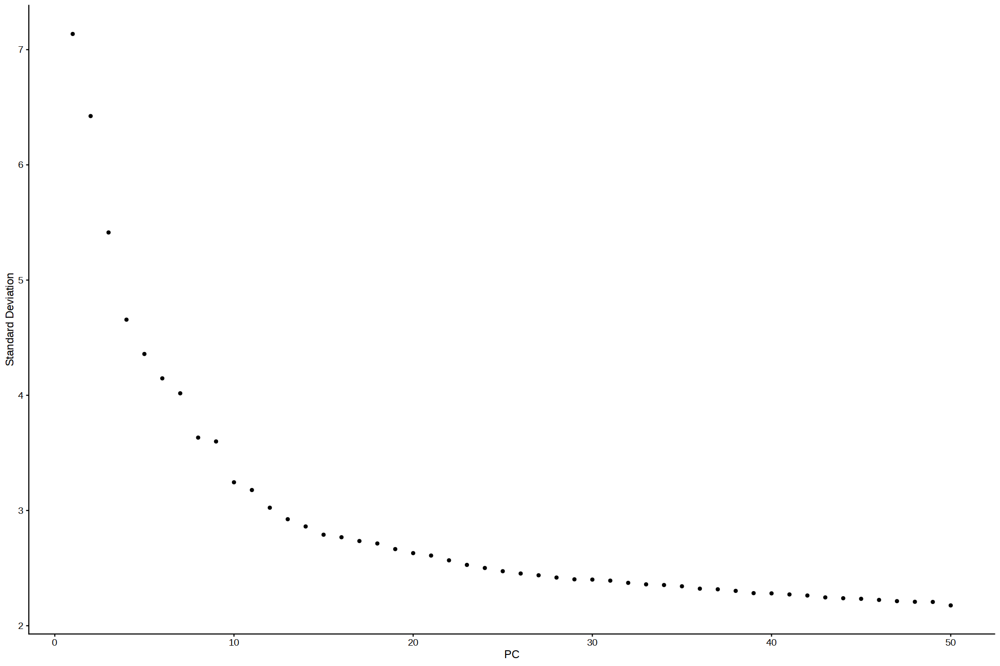

In [51]:
ElbowPlot(A, 50)

In [80]:
A <- FindNeighbors(A, dims = 1:15)
A<- FindClusters(A, resolution = 0.7)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 656
Number of edges: 20988

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7257
Number of communities: 6
Elapsed time: 0 seconds


In [81]:
A <- RunUMAP(A, dims = 1:15, n.neighbors = 10, verbose = FALSE)

### Check annotation

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Sox2”
Warning message in FeaturePlot(A, c("Tbx6", "Sox2"), min.cutoff = "q1"):
“All cells have the same value (2.15894963937479) of Tbx6.”


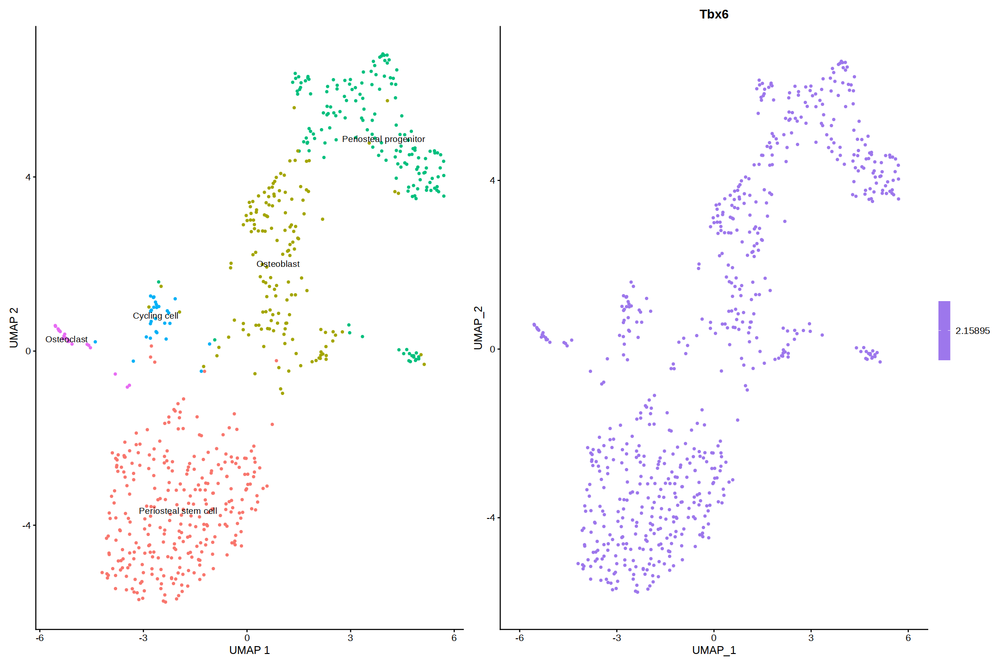

In [84]:
# Paraxial Mesoderm: Tbx6+, Sox2-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Tbx6", "Sox2"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Wt1, Pax2”


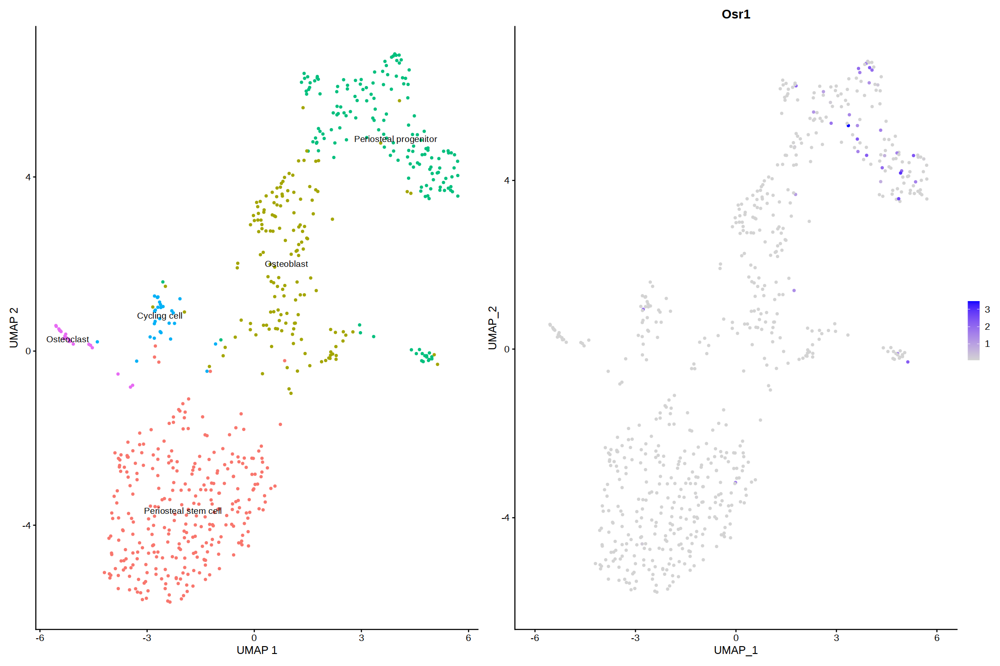

In [6]:
# Intermediate Mesoderm: Osr1, Wt1, Pax2
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Osr1", "Wt1", "Pax2"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Gata4”
Warning message in FeaturePlot(A, c("Foxf1", "Bmp4", "Hoxb6", "Hand1", "Hand2", :
“All cells have the same value (0.0826773505264401) of Hoxb6.”


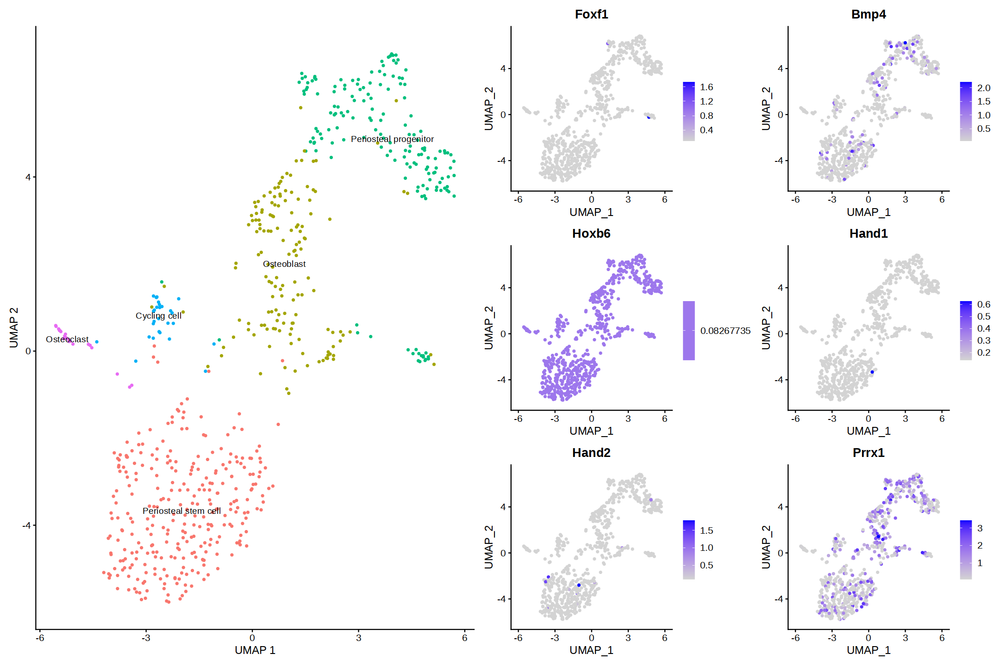

In [7]:
# Lateral plate mesoderm
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Foxf1", "Bmp4", "Hoxb6", "Hand1", "Hand2", "Gata4","Prrx1"), min.cutoff = "q1")  

p1 + p2

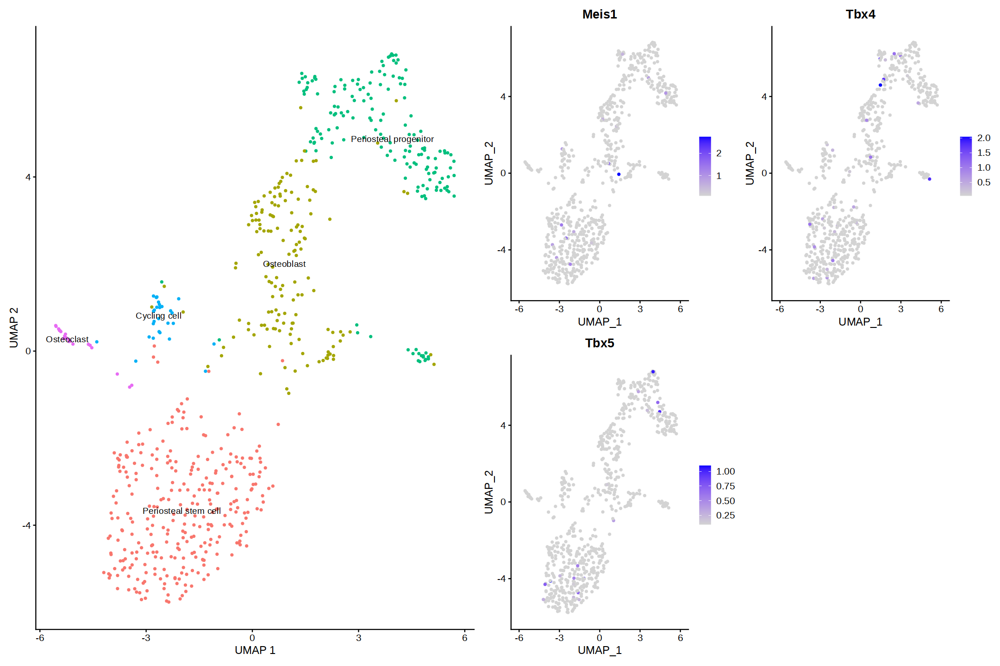

In [8]:
# Early limb bud mesenchyme
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Meis1", "Tbx4", "Tbx5"), min.cutoff = "q1")  

p1 + p2

In [9]:
# ZPA
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Shh"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Shh”


ERROR: Error: None of the requested features were found: Shh in slot data


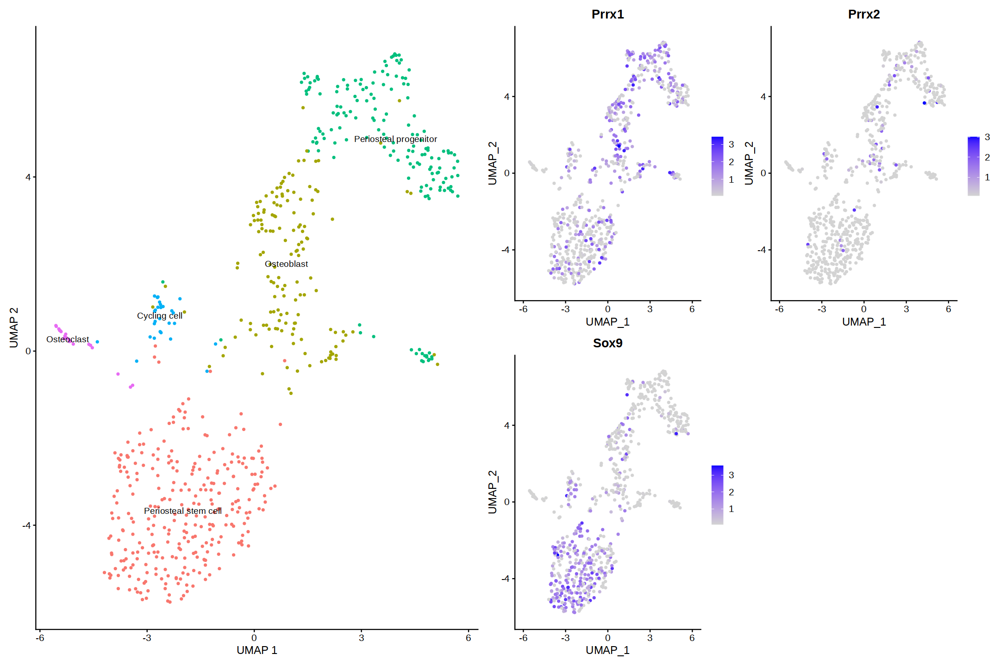

In [10]:
# Chondroprogenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Prrx1", "Prrx2", "Sox9"), min.cutoff = "q1")  

p1 + p2

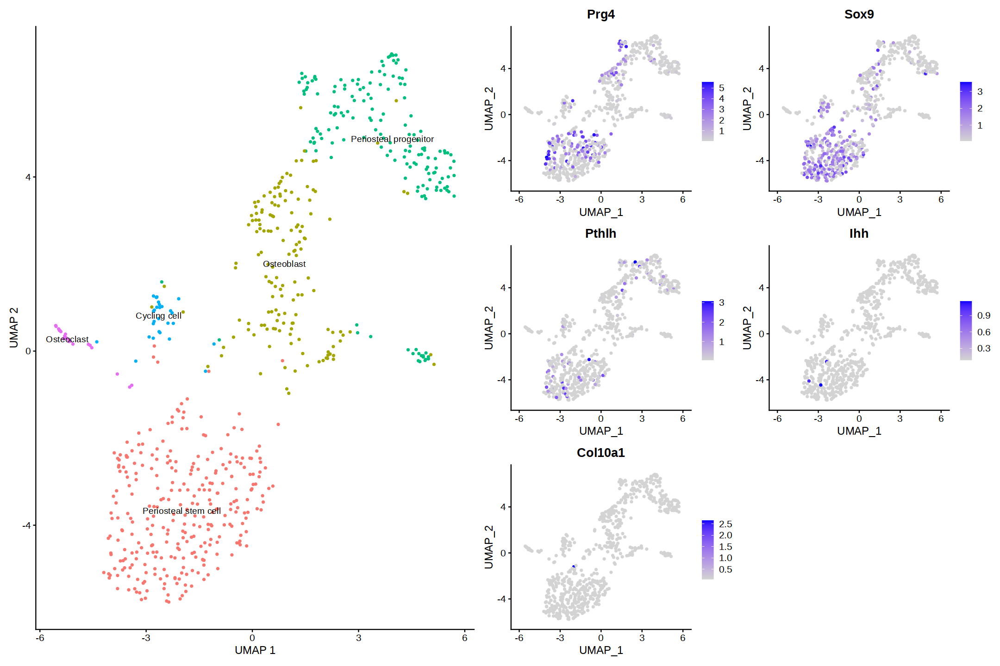

In [11]:
# Chondrocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Prg4","Sox9","Pthlh","Ihh","Col10a1"), min.cutoff = "q1")  

p1 + p2

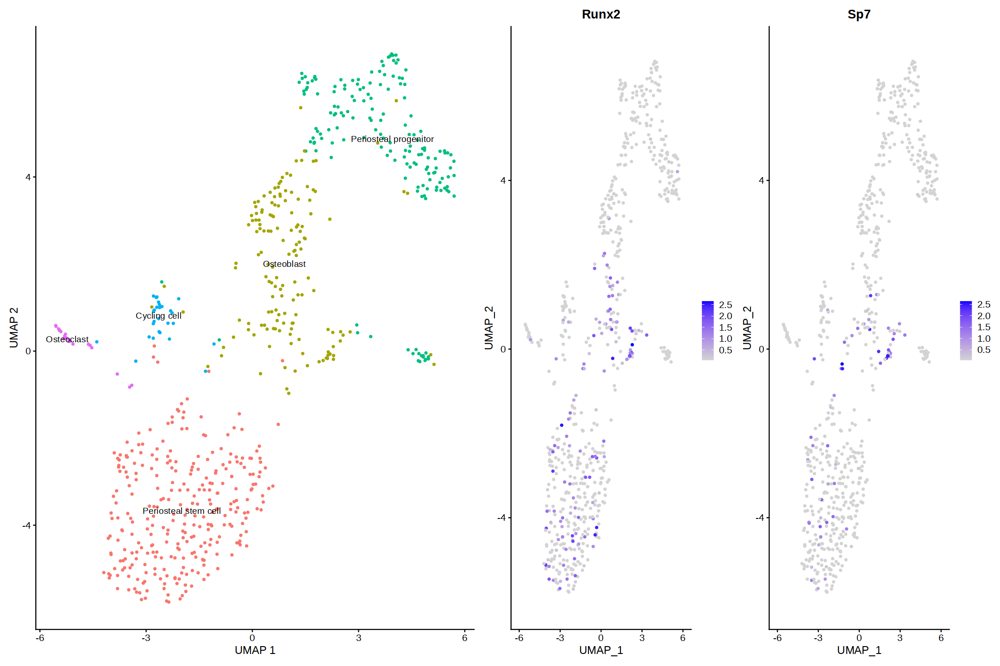

In [12]:
# Osteoprogenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Runx2", "Sp7"), min.cutoff = "q1")  

p1 + p2

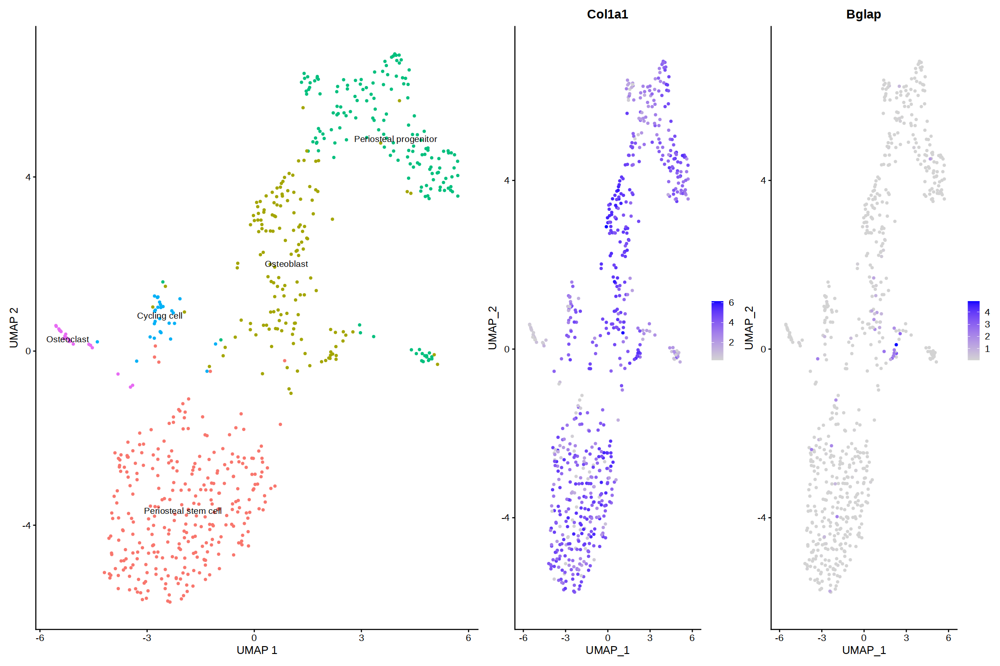

In [13]:
# Osteoblasts
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Col1a1", "Bglap"), min.cutoff = "q1")  

p1 + p2

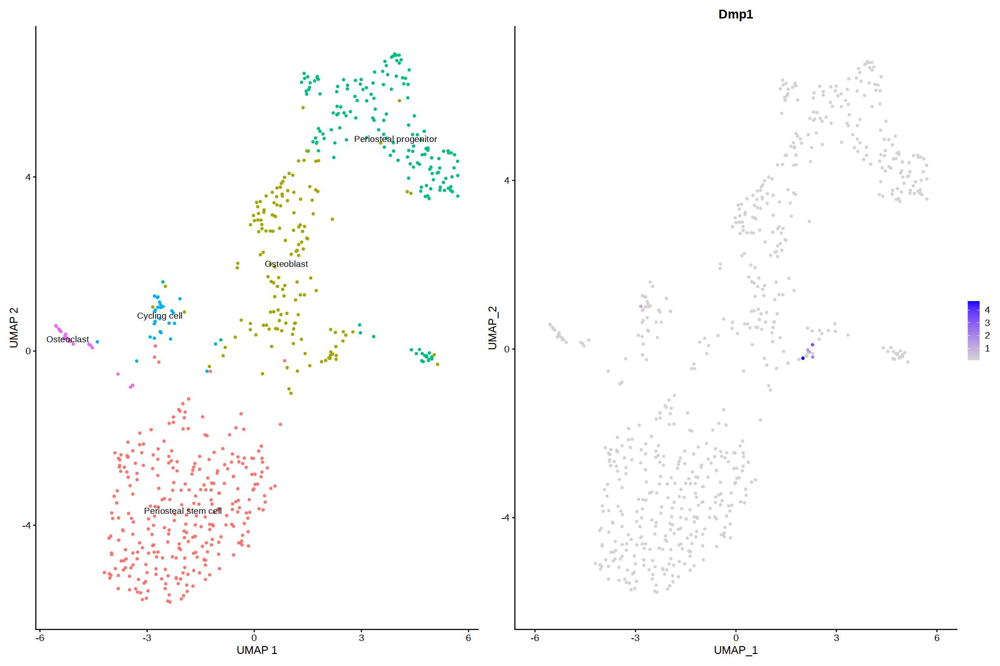

In [14]:
# Osteocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Dmp1"), min.cutoff = "q1")  

p1 + p2

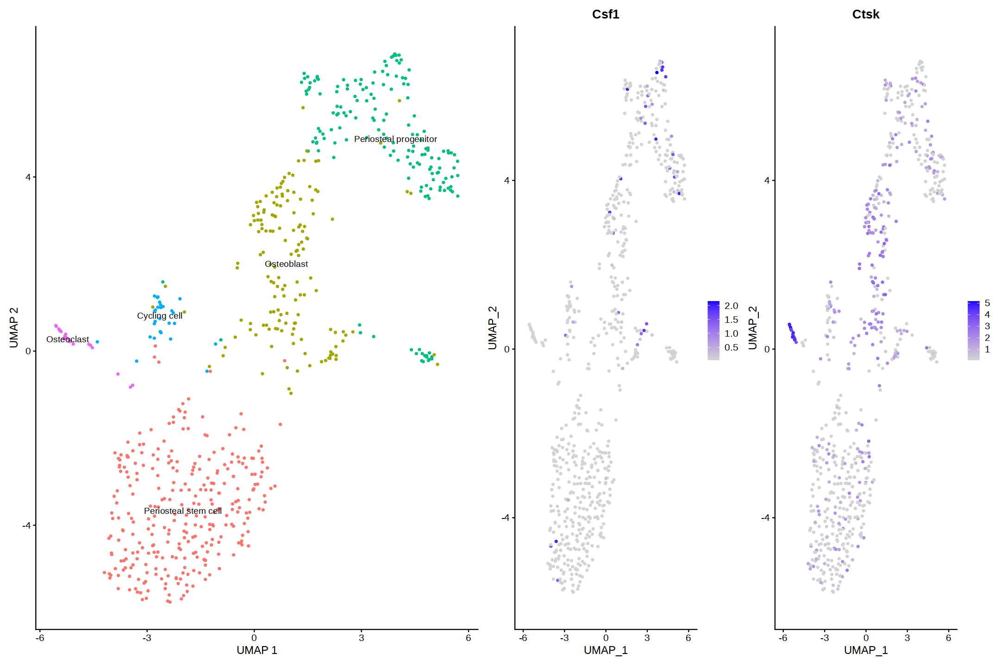

In [15]:
# Osteoclasts
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Csf1", "Ctsk"), min.cutoff = "q1")  

p1 + p2

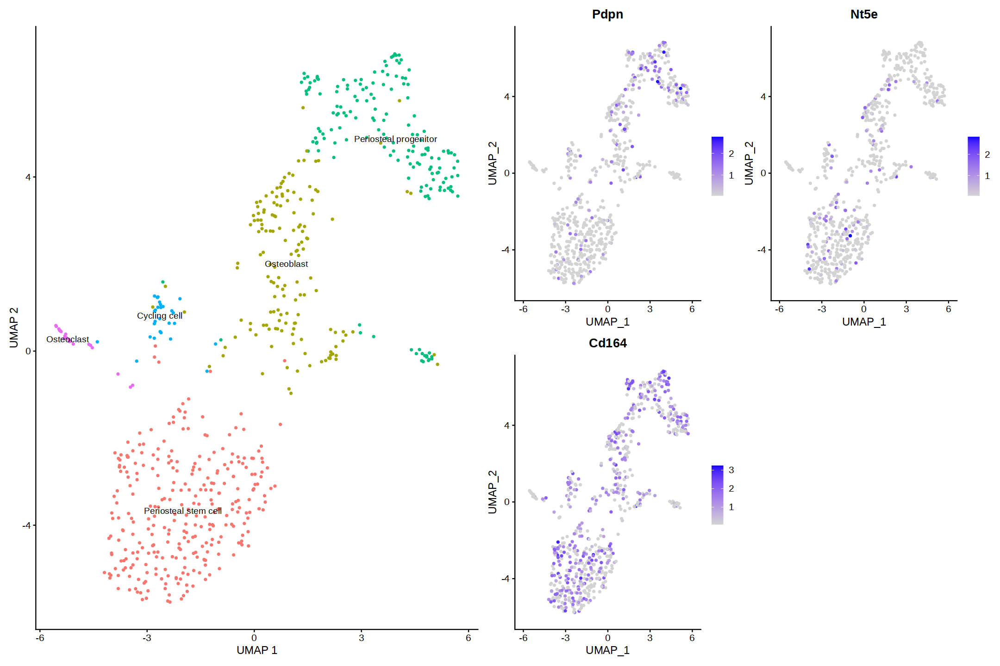

In [16]:
# Periosteal stem cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pdpn", "Nt5e", "Cd164"), min.cutoff = "q1")  

p1 + p2

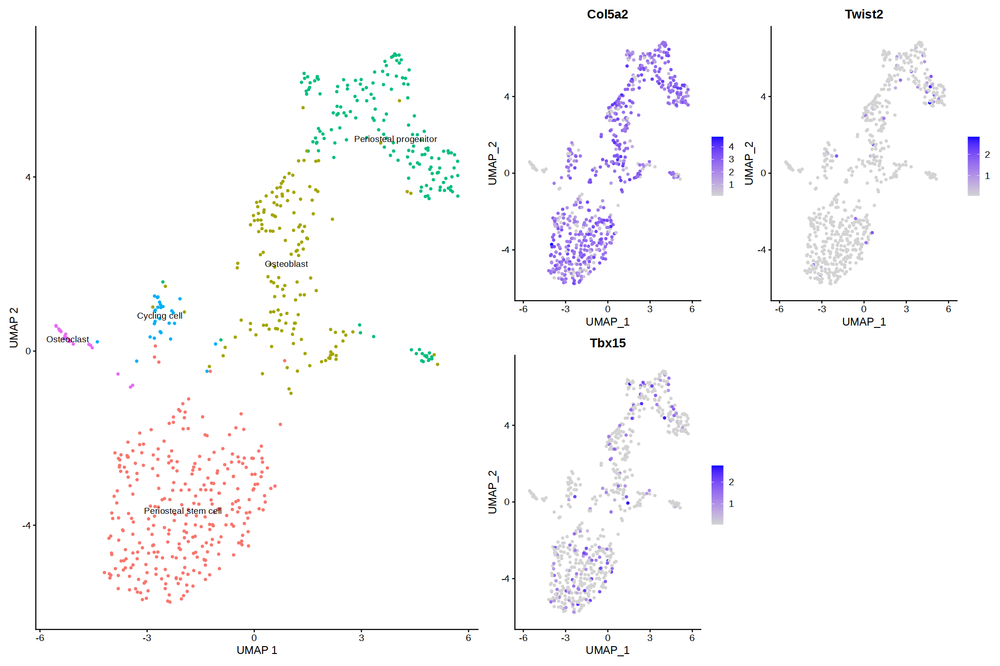

In [17]:
# Periosteal progenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Col5a2", "Twist2", "Tbx15"), min.cutoff = "q1")  

p1 + p2

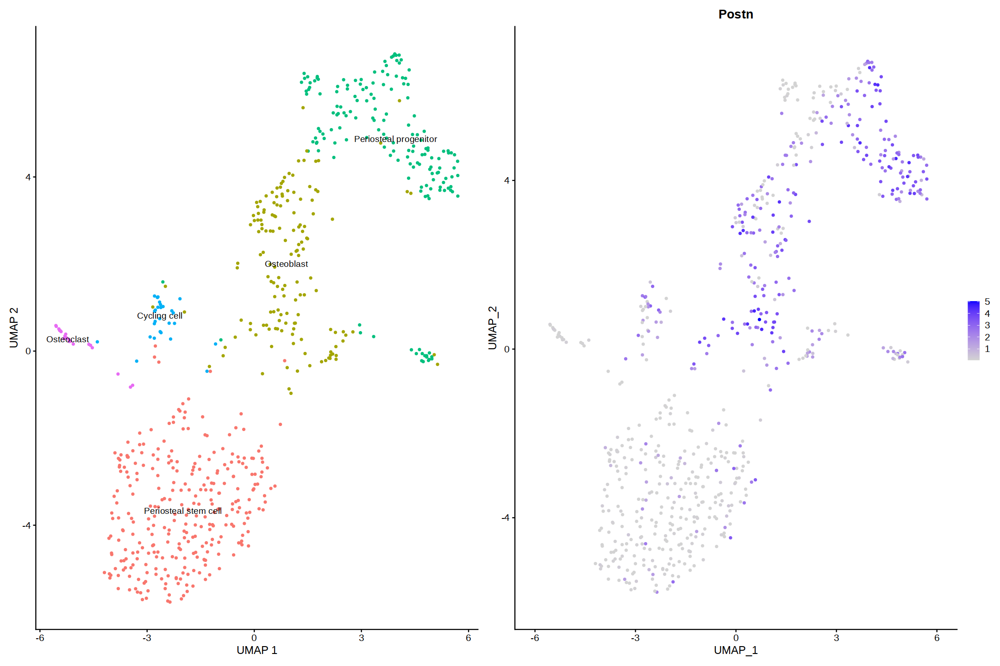

In [18]:
# Periosteum
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Postn"), min.cutoff = "q1")  

p1 + p2

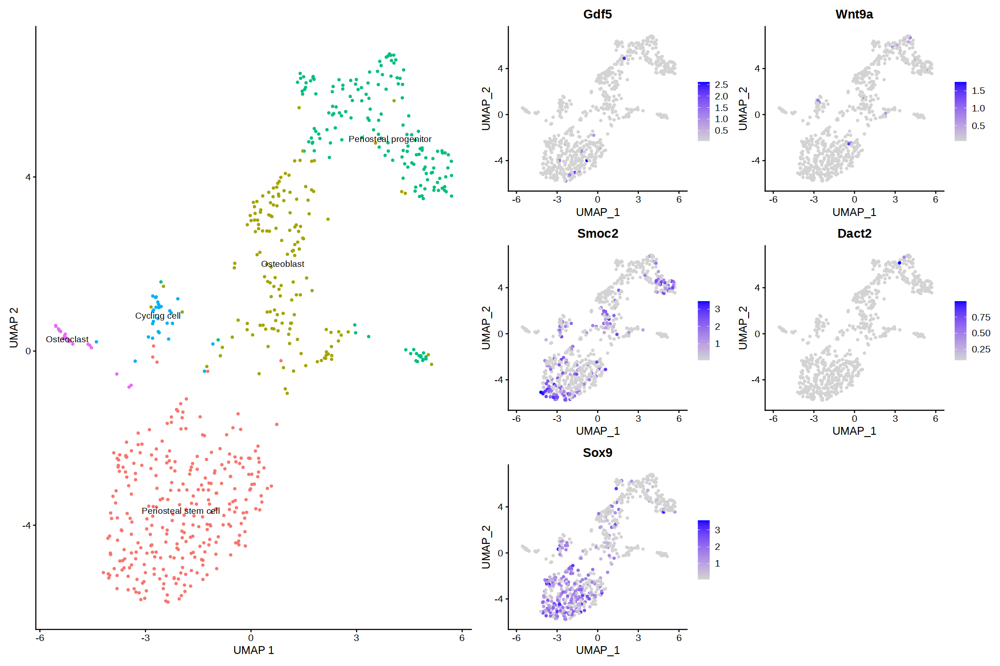

In [19]:
# Joint precursors: sox9-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Gdf5", "Wnt9a", "Smoc2", "Dact2","Sox9"), min.cutoff = "q1")  

p1 + p2

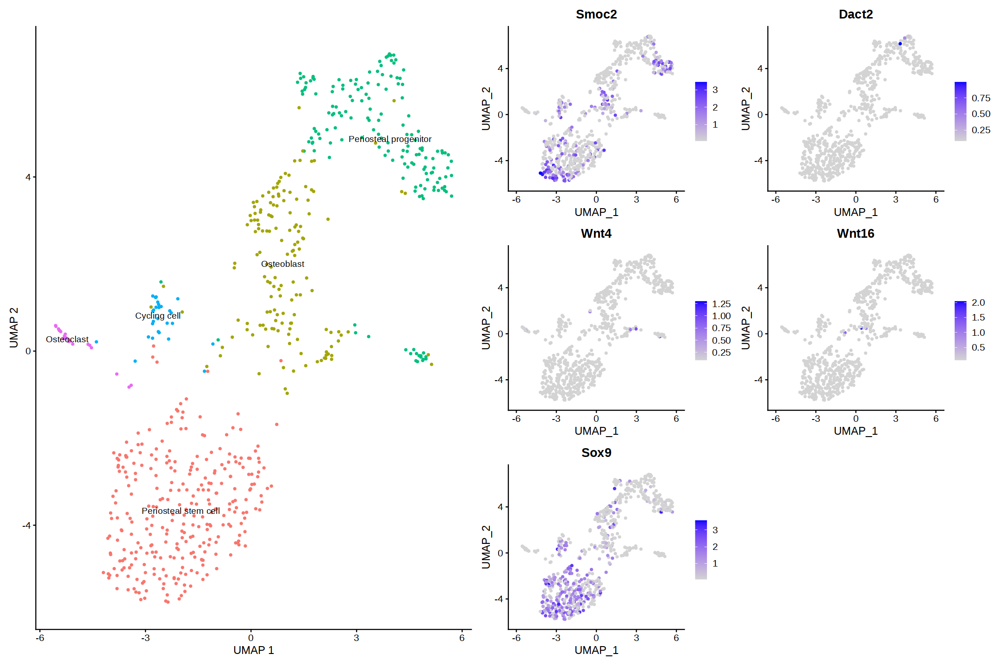

In [20]:
# Interzone cells: sox9-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Smoc2", "Dact2", "Wnt4", "Wnt16","Sox9"), min.cutoff = "q1")  

p1 + p2

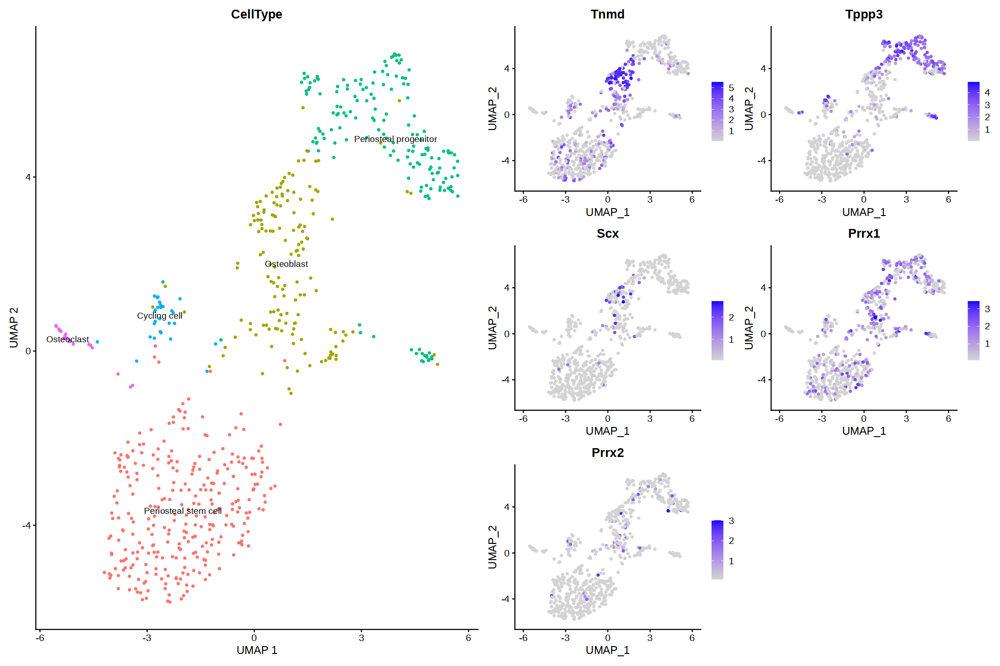

In [21]:
# Tenocyte precursors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE, group.by="CellType") + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Tnmd", "Tppp3", "Scx", "Prrx1", "Prrx2"), min.cutoff = "q1")  

p1 + p2

In [ ]:
# Tenocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Scx", "Tnmd"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Dra, Hla”


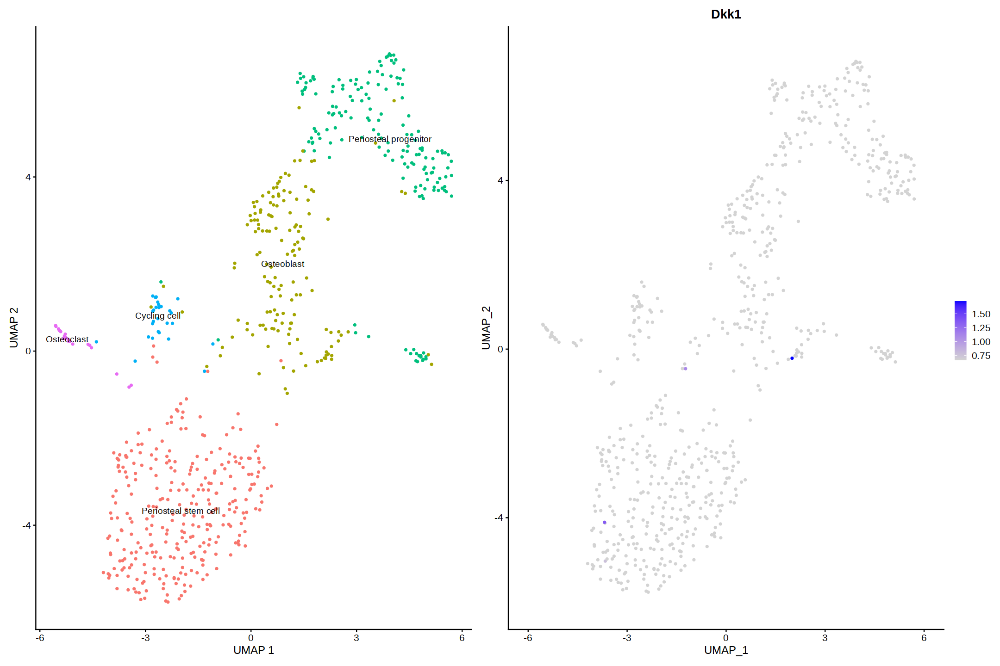

In [22]:
# Synovial fibroblasts: Hla-
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Dkk1", "Dra","Hla"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Sim1, Pax3”


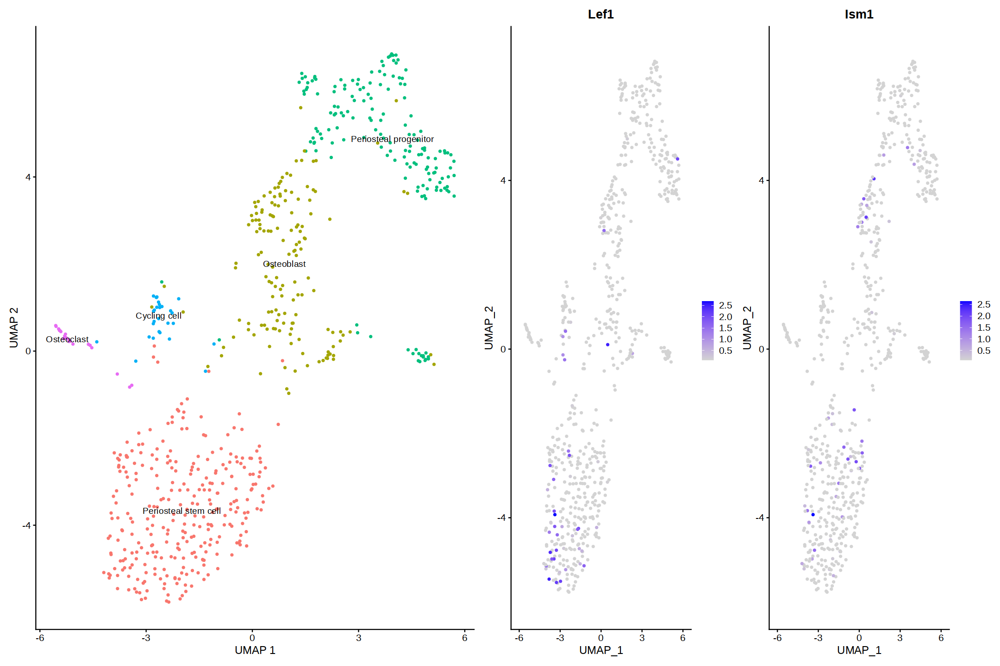

In [23]:
# Dermomyotome
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Sim1", "Pax3", "Lef1", "Ism1"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Myhc, Mrf4, Myog”


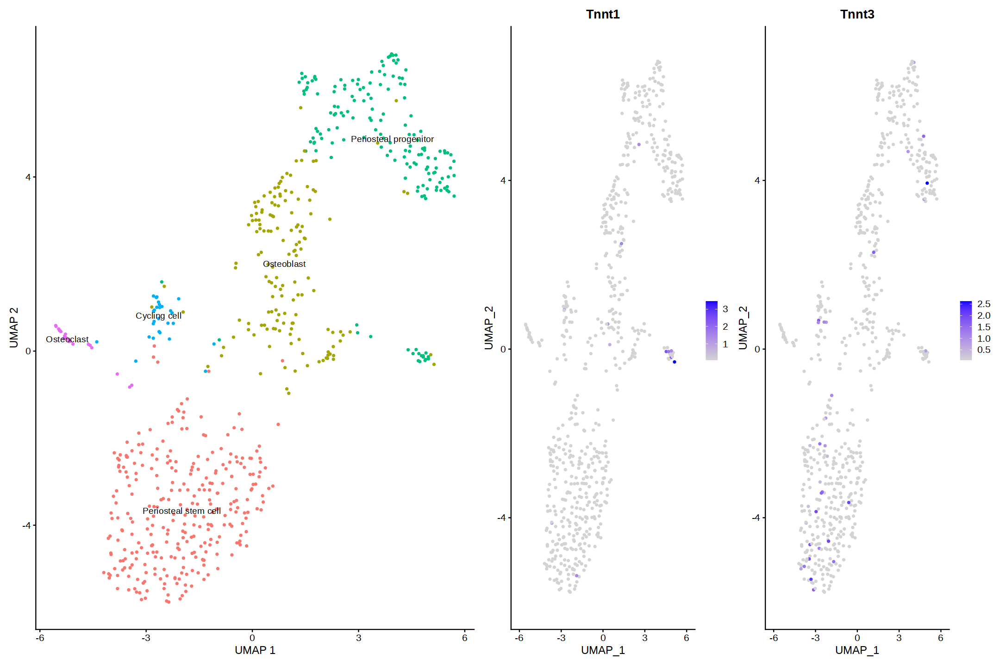

In [24]:
# Skeletal muscle cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Myhc", "Mrf4","Myog","Tnnt1","Tnnt3"), min.cutoff = "q1")  

p1 + p2

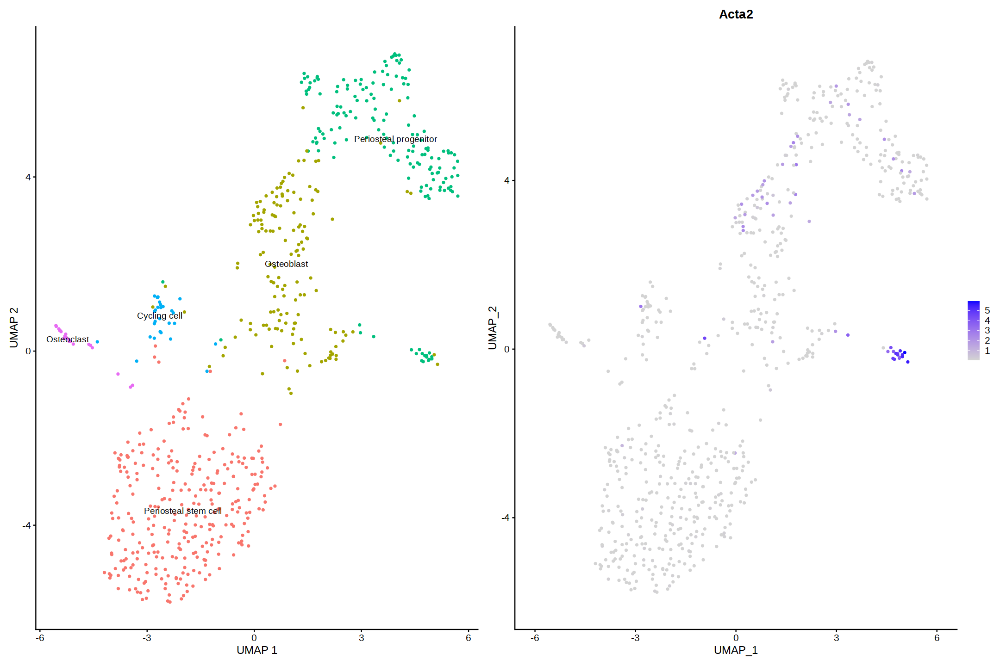

In [25]:
# Smooth muscle cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Acta2"), min.cutoff = "q1")  

p1 + p2

In [26]:
# Myogenic stem cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pax7","Myf5"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Pax7, Myf5”


ERROR: Error: None of the requested features were found: Pax7, Myf5 in slot data


Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Pax7, Notch, Myf5, Pax3, Myod”


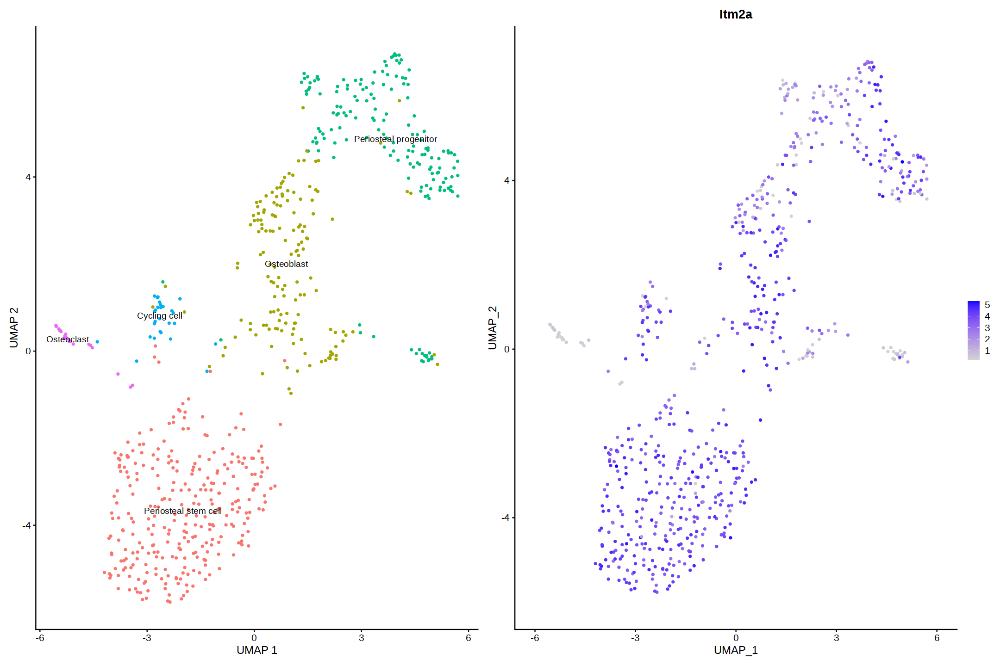

In [27]:
# Muscle progenitors
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pax7", "Notch", "Itm2a", "Myf5", "Pax3", "Myod"), min.cutoff = "q1")  

p1 + p2

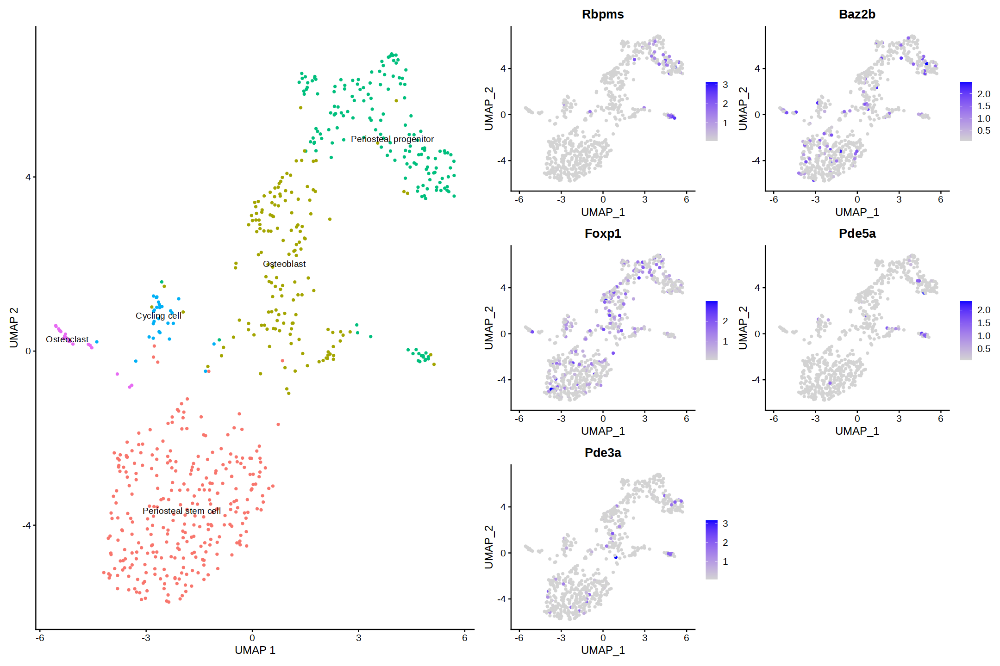

In [28]:
# Cardiomyocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Rbpms", "Baz2b", "Foxp1", "Pde5a", "Pde3a"), min.cutoff = "q1")  

p1 + p2

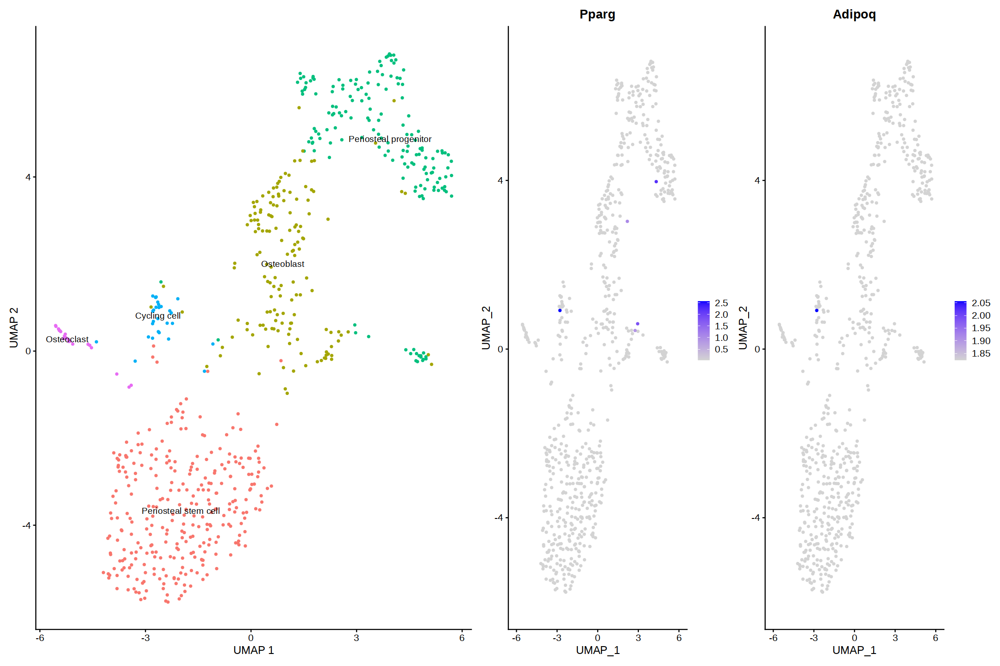

In [29]:
# Adipocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Pparg", "Adipoq"), min.cutoff = "q1")  

p1 + p2

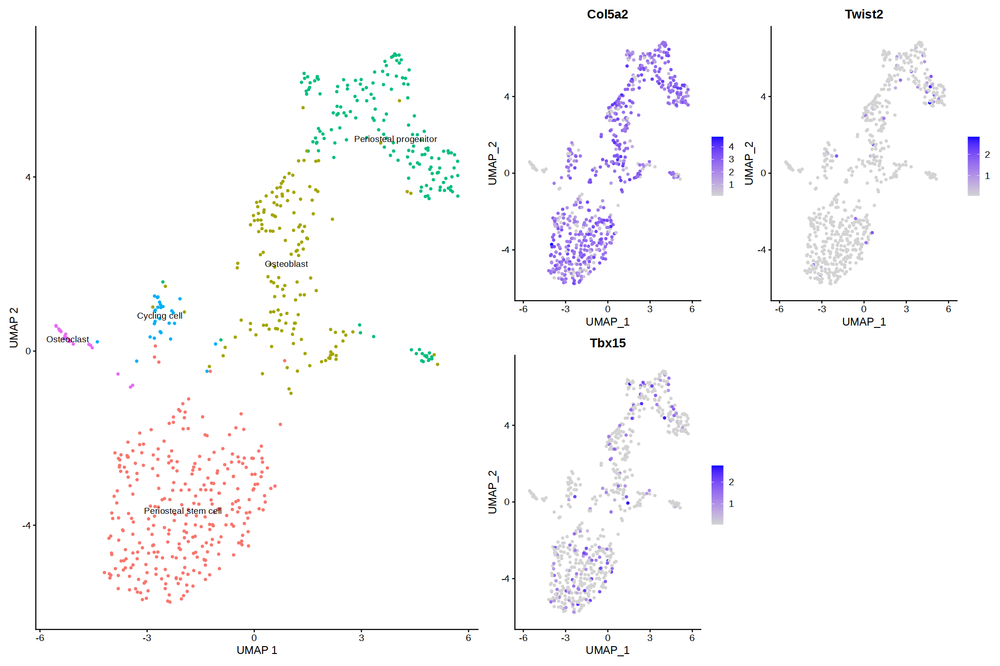

In [30]:
# Perichondrium
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Col5a2", "Twist2", "Tbx15"), min.cutoff = "q1")  

p1 + p2

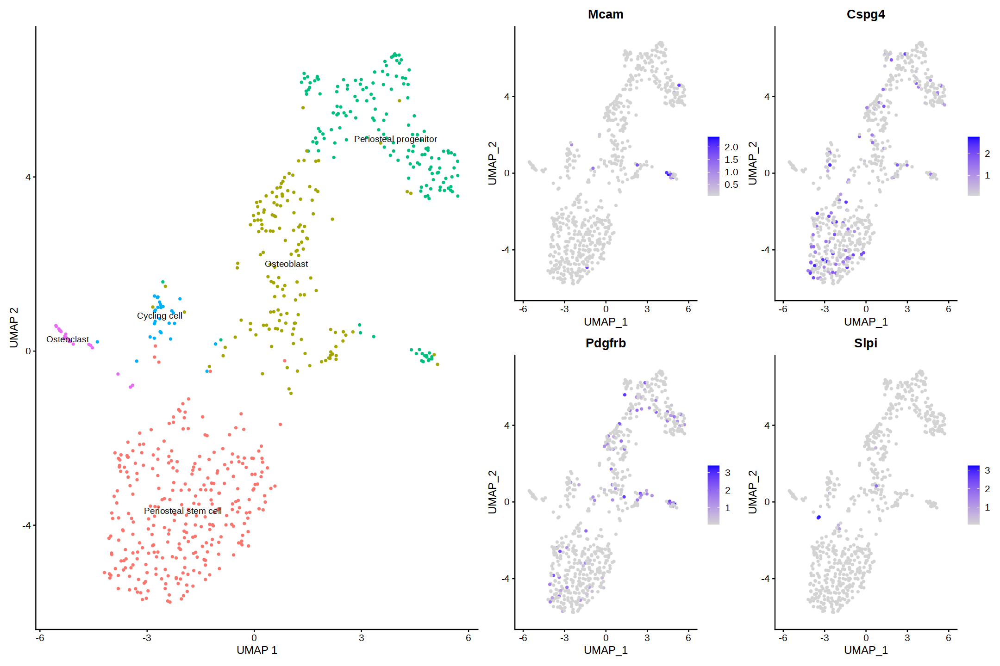

In [31]:
# Pericytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Mcam", "Cspg4", "Pdgfrb", "Slpi"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Cd105, Cd90”


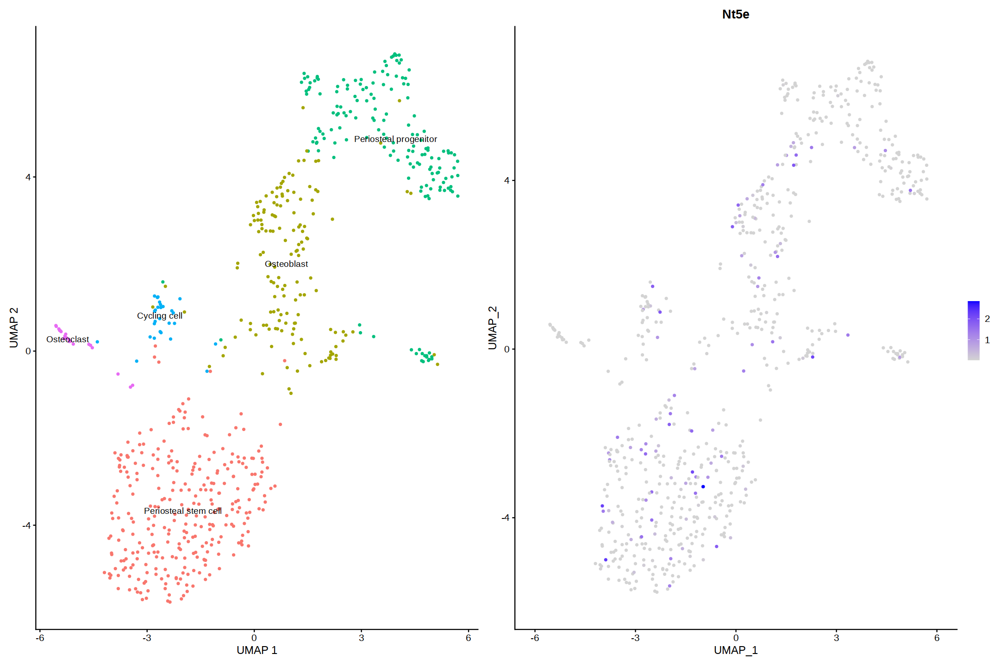

In [32]:
# BMSC
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Cd105", "Nt5e", "Cd90"), min.cutoff = "q1")  

p1 + p2

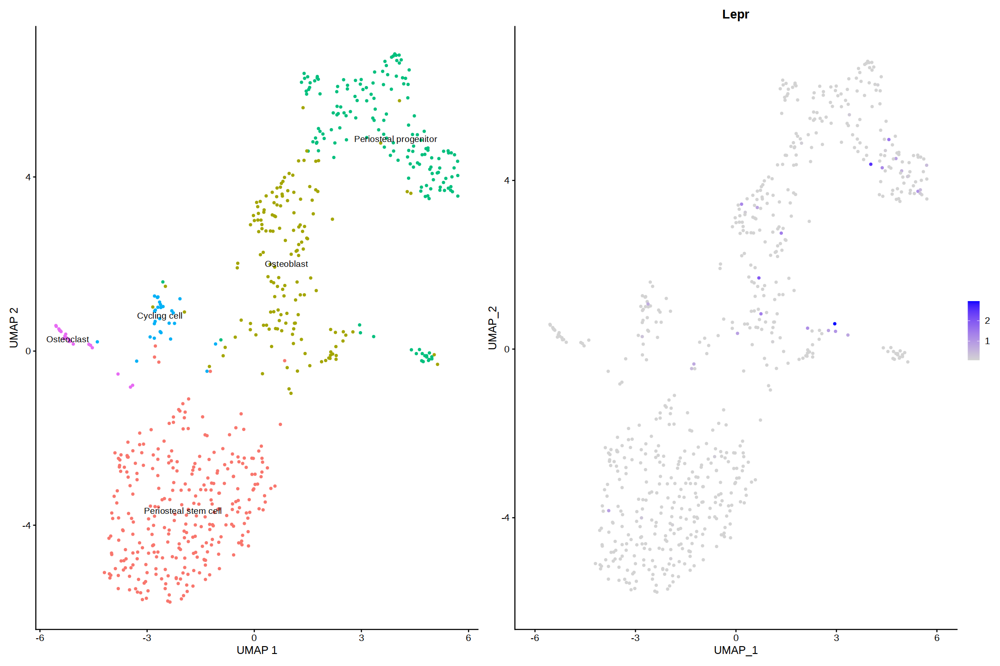

In [33]:
# LepR+ BMSC
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Lepr"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Sca1”


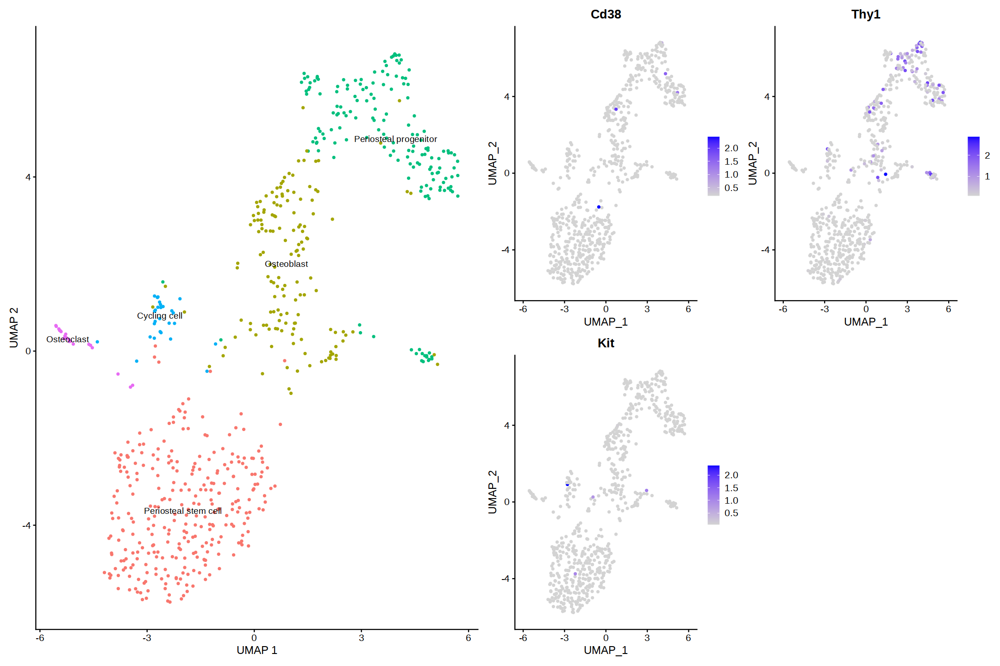

In [34]:
# Hematopoetic stem cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Cd38", "Thy1", "Kit", "Sca1"), min.cutoff = "q1")  

p1 + p2

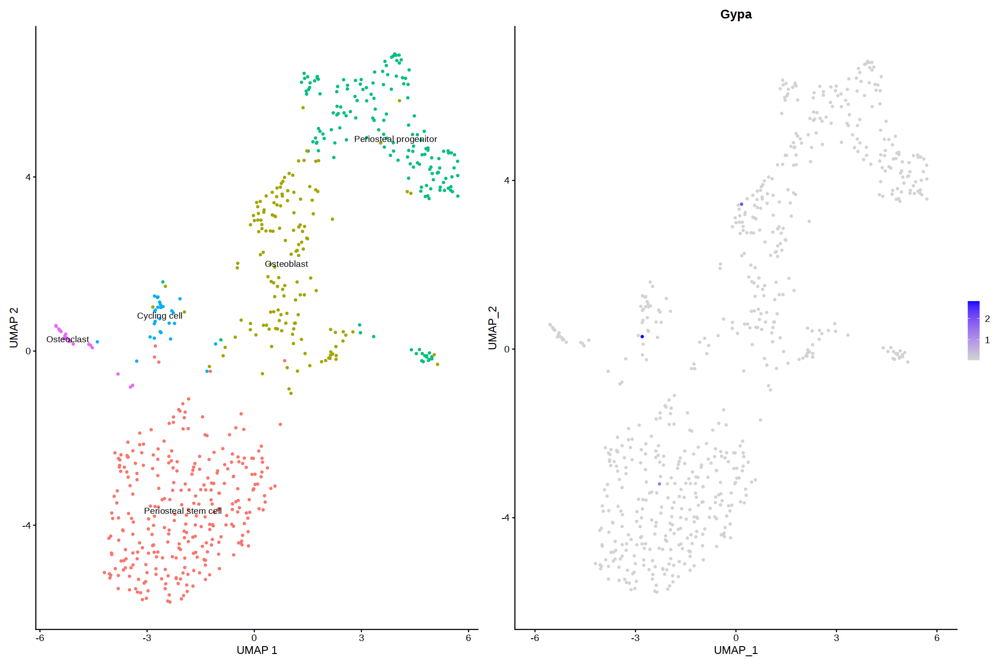

In [35]:
# Erythroid cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Gypa"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: F2rl2”


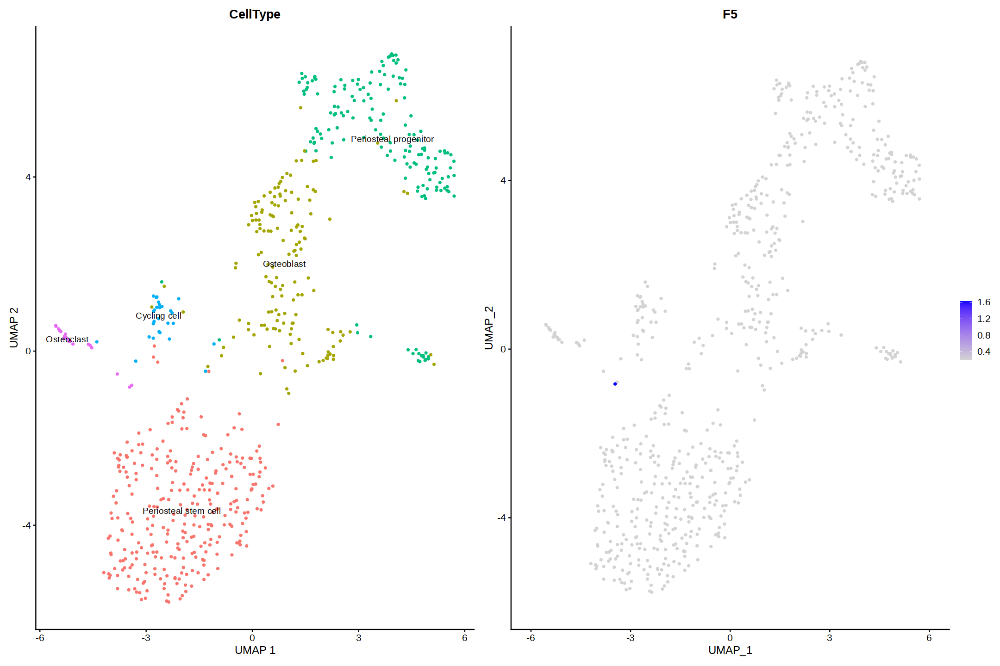

In [36]:
# Platelets
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE, group.by="CellType") + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("F2rl2", "F5"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Gata1, Selp, Gp6, Gp1ba”


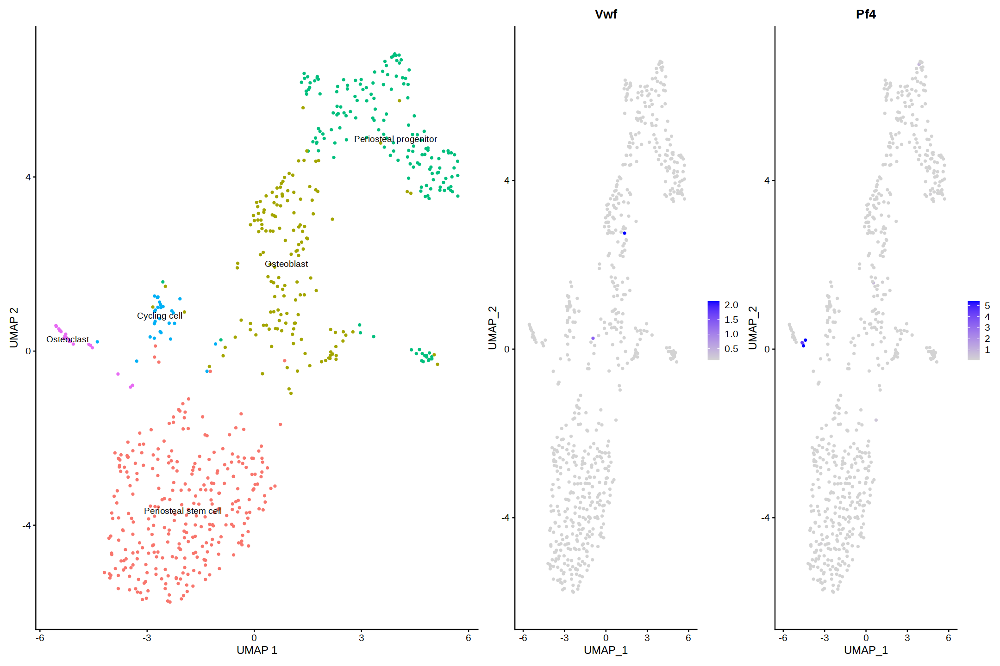

In [37]:
# Megakaryocytes
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Vwf", "Pf4", "Gata1", "Selp", "Gp6", "Gp1ba"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Cd3g, Flt3”
Warning message in FeaturePlot(A, c("Cd3g", "Cd19", "Cd68", "Cxcr2", "Mrc1", "Flt3"), :
“All cells have the same value (0.0658400937925944) of Cd19.”


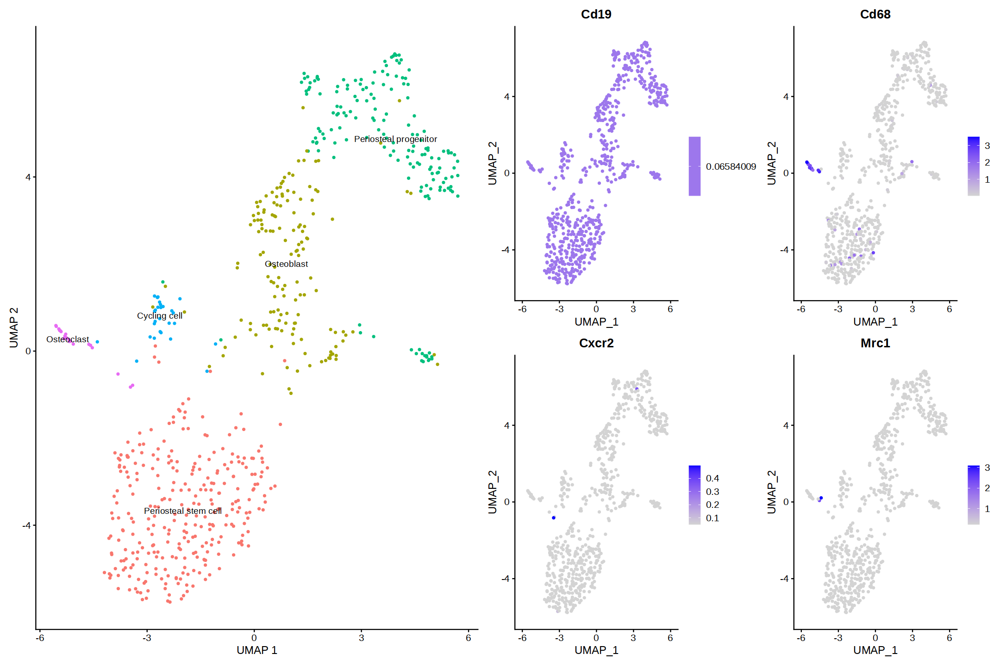

In [38]:
# Immune cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Cd3g", "Cd19", "Cd68", "Cxcr2","Mrc1","Flt3"), min.cutoff = "q1")  

p1 + p2

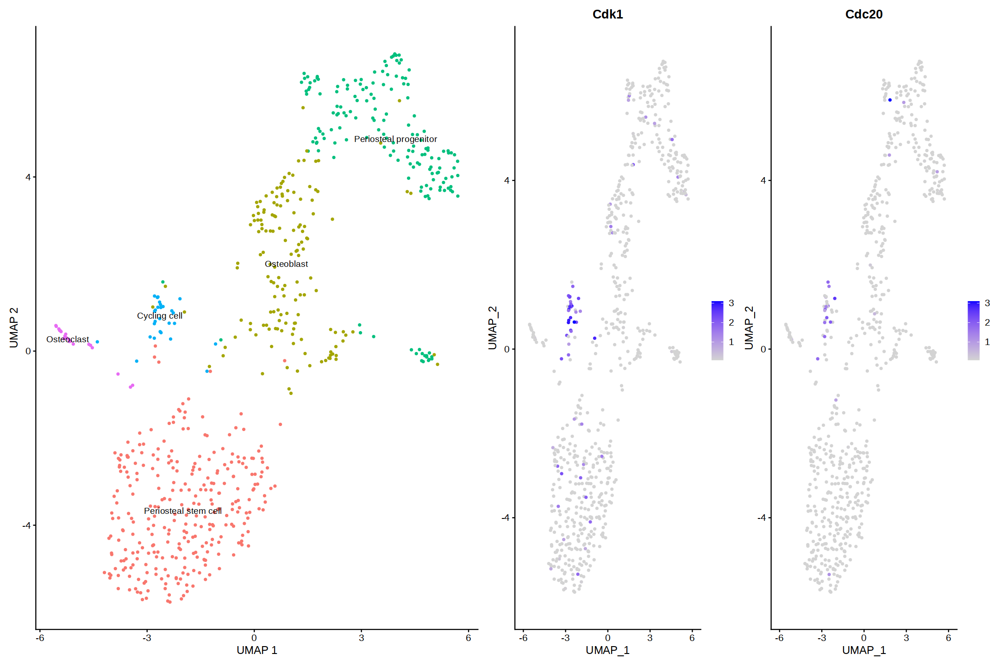

In [39]:
# Fast proliferating cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Cdk1","Cdc20"), min.cutoff = "q1")  

p1 + p2

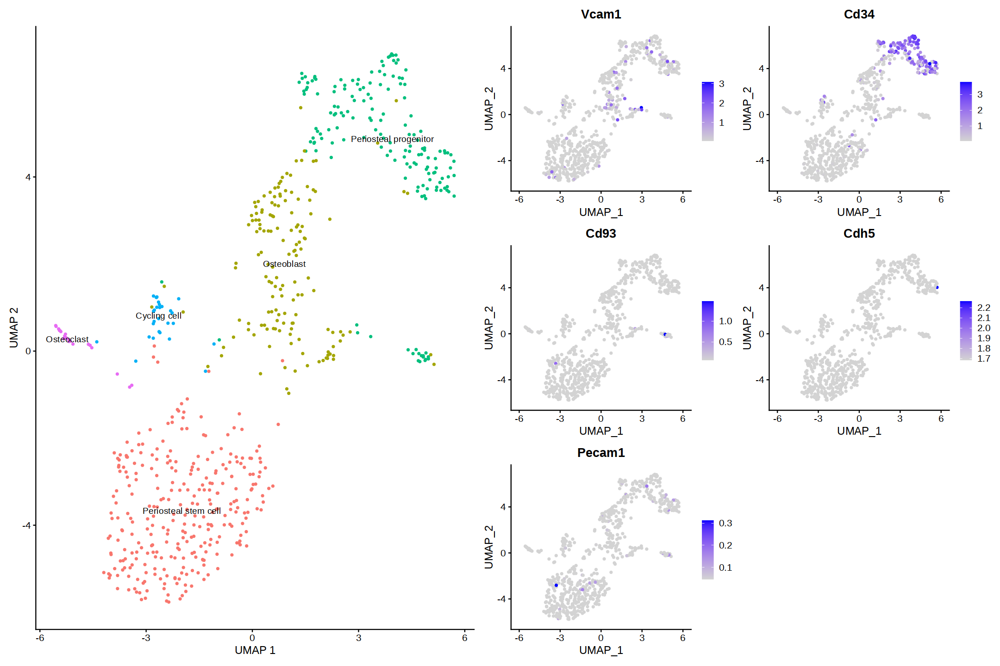

In [40]:
# Vascular endothelial cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Vcam1", "Cd34", "Cd93", "Cdh5","Pecam1"), min.cutoff = "q1")  

p1 + p2

Warning message in FeaturePlot(A, c("Lyve1", "Flt4", "Prox1"), min.cutoff = "q1"):
“All cells have the same value (1.656092176869) of Flt4.”


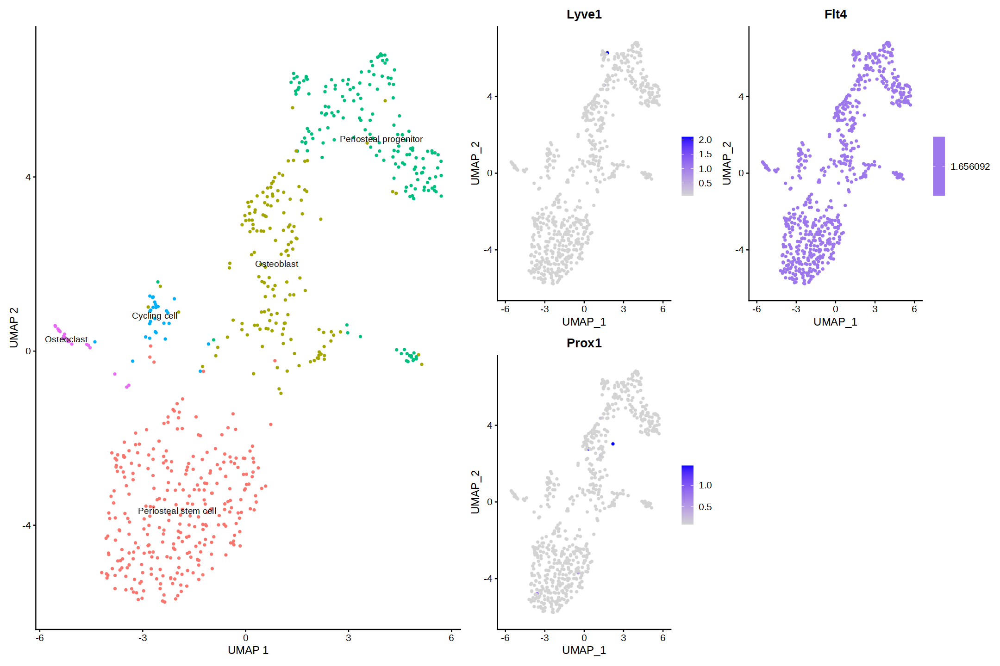

In [41]:
# Lymphatic endothelial cells
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Lyve1", "Flt4", "Prox1"), min.cutoff = "q1")  

p1 + p2

In [42]:
# Apical ectodermal ridge
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Fgf8", "Fgf4"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Fgf8, Fgf4”


ERROR: Error: None of the requested features were found: Fgf8, Fgf4 in slot data


Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Wnt7a”


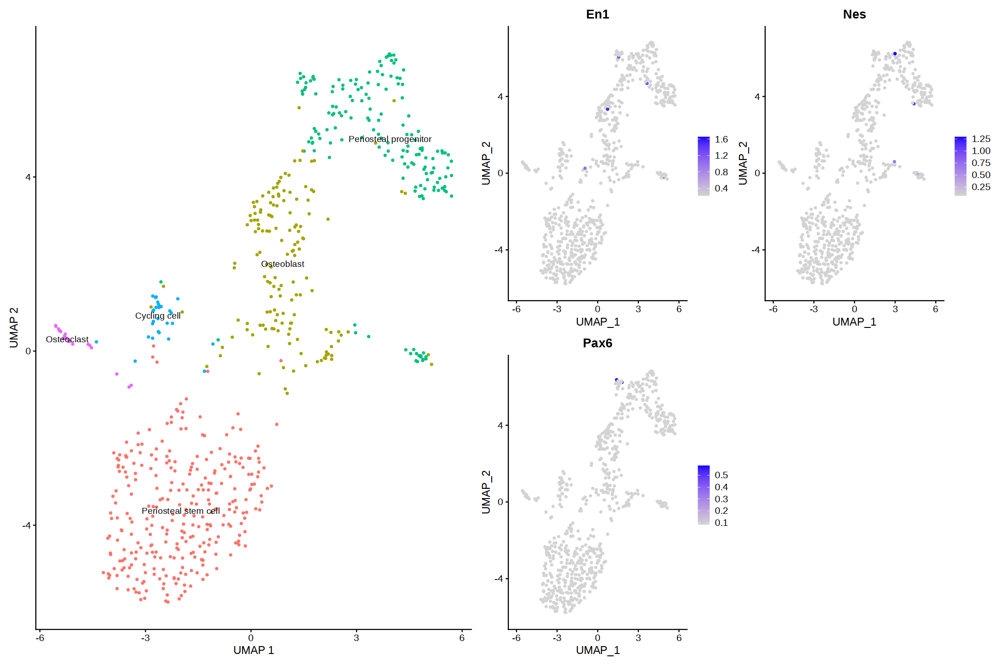

In [43]:
# Ectoderm
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Wnt7a", "En1", "Nes", "Pax6"), min.cutoff = "q1")  

p1 + p2

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Nefl”


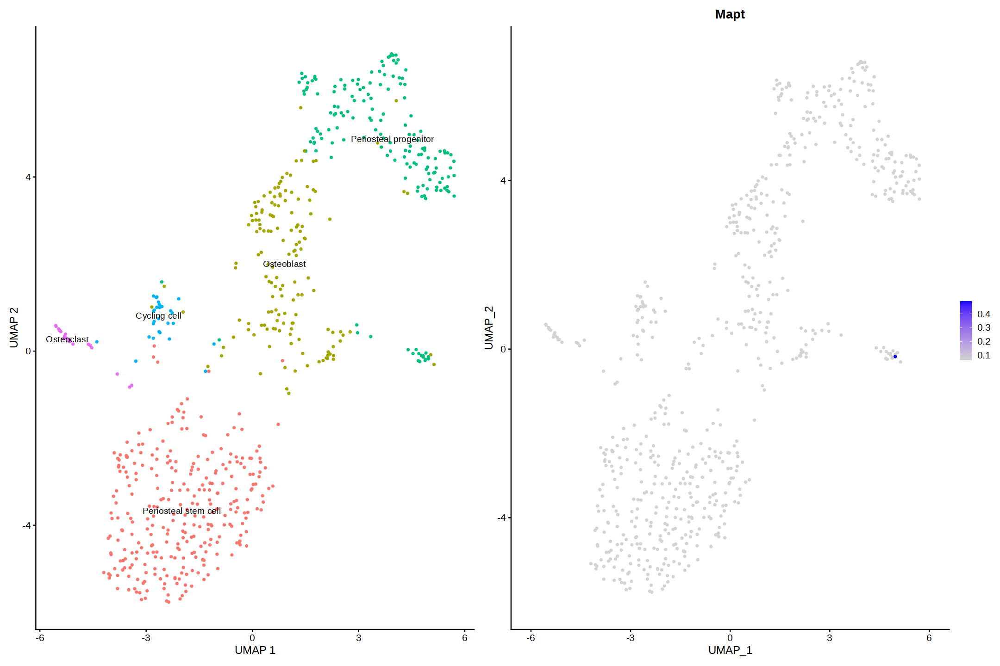

In [44]:
# Neurons
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Nefl", "Mapt"), min.cutoff = "q1")  

p1 + p2

Warning message in FeaturePlot(A, c("Krt5", "Krt10"), min.cutoff = "q1"):
“All cells have the same value (0.423922282576309) of Krt5.”


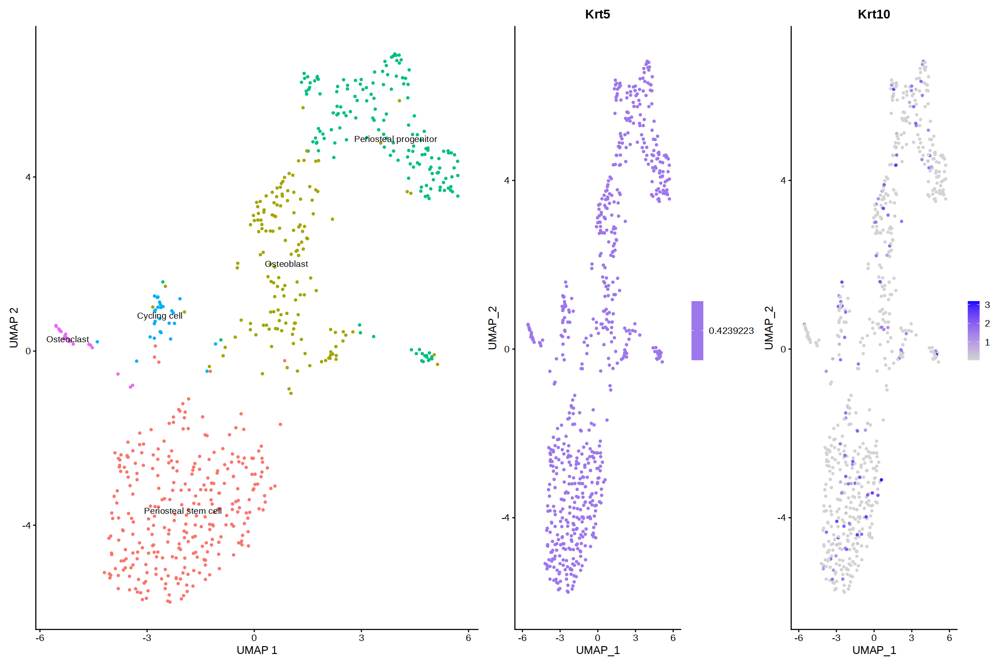

In [45]:
# Skin
options(repr.plot.width = 18, repr.plot.height = 12)

p1 <- DimPlot(A, label = TRUE) + NoLegend() + xlab("UMAP 1") + ylab("UMAP 2")
p2 <- FeaturePlot(A, c("Krt5", "Krt10"), min.cutoff = "q1")  

p1 + p2

### 3.4. Differential expression analysis<a id="12"></a>
#### 3.4.1. Global annotation by differential expression analysis<a id="13"></a>

Seurat identifies markers that define clusters via differential expression. By default, it identifes positive and negative markers of a single cluster (specified in ident.1), compared to all other cells. `FindAllMarkers` automates this process for all clusters, but it is possible to test groups of clusters vs. each other, or against all cells.

The `min.pct` argument requires a feature to be detected at a minimum percentage in either of the two groups of cells, and the `thresh.test` argument requires a feature to be differentially expressed (on average) by some amount between the two groups. You can set both of these to 0, but with a dramatic increase in time - since this will test a large number of features that are unlikely to be highly discriminatory. As another option to speed up these computations, `max.cells.per.ident` can be set. This will downsample each identity class to have no more cells than whatever this is set to. While there is generally going to be a loss in power, the speed increases can be significiant and the most highly differentially expressed features will likely still rise to the top.

In [85]:
# Seurat default settings
#A.markers <- FindAllMarkers(A, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

In [69]:
#dir.create("./6-kmita/analysis")
write.csv(A.markers, file = "A.markers.csv", quote = FALSE)

**Adding cell types**

In [12]:
A@meta.data$CellType <- NULL

In [13]:
#creating column that contains cell type 
A@meta.data$CellType <- Idents(A)

In [14]:
A@meta.data$CellType <- as.character(A@meta.data$CellType)

A@meta.data$CellType[A@meta.data$CellType == '0'] <- 'Periosteal stem cell'
A@meta.data$CellType[A@meta.data$CellType == '1'] <- 'Periosteal progenitor'
A@meta.data$CellType[A@meta.data$CellType == '2'] <- 'Osteoblast'
A@meta.data$CellType[A@meta.data$CellType == '3'] <- 'Cycling cell'
A@meta.data$CellType[A@meta.data$CellType == '4'] <- 'Osteoclast'


A@meta.data$CellType <- as.factor(A@meta.data$CellType)

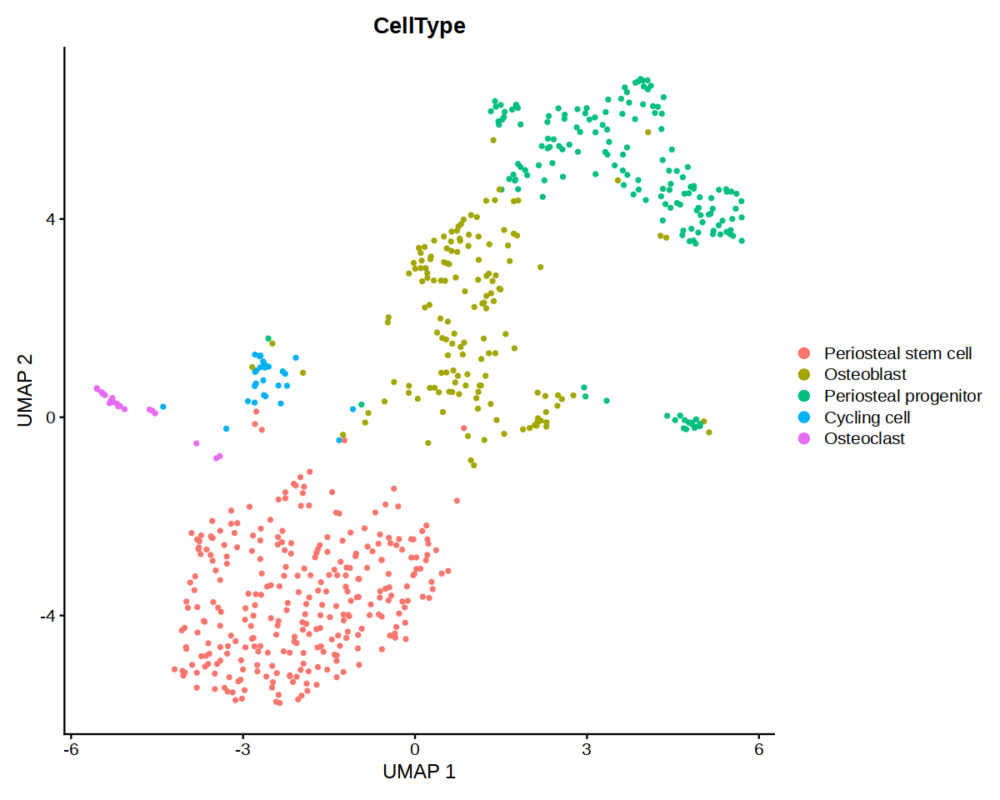

In [86]:
options(repr.plot.width = 10, repr.plot.height = 8)

DimPlot(A, reduction = "umap", label = FALSE, group.by = "CellType") + xlab("UMAP 1") + ylab("UMAP 2")

In [16]:
Idents(A)<-A@meta.data$CellType

In [464]:
saveRDS(A, file = "Bian_reannotation.Rds")